# ___Ley de Snell___

Fabián Suárez Lestón

f.suarez.leston@gmail.com

Esta notbeook está diseñada para la enseñanza de la Ley de Snell en la materia de Física de 2º de Bachillerato.

#### __Instrucciones de la notebook__

Para usar esta notebook no es necesario que instales nada ni tengas conocimientos de programación. El código escrito por tu profesor te permitirá ver las explicaciones y ver el efecto de algunos parámetros relevantes en la formación del arcoiris.

Es necesario que ejecutes **todas** las celdas de código para que funcione correctamente. Los parámetros que puedes modificar aparecerán con deslizadores antes de cada representación.

En las celdas que tengan a la izquiera unos corchetes "[]" (con o sin un número entre ellos) y en las que se te pida escribir, debes cambiar el "None" por el número que se te pide. El separador decimal ha de ser el punto ".". Por ejemplo, si se te pide tu altura en metros y mides 1,70 m, entonces la casilla

In [1]:
altura = None

Debes modificarla para obtener

In [2]:
altura = 1.70

Las siguientes celdas son definiciones importantes para luego. Ejecútalas y pasa a la siguiente sección.

In [3]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import ipywidgets

from definitions import *
from matplotlib import animation
from IPython.display import display, HTML, display_html
from ipywidgets import interact, interact_manual, IntProgress
from matplotlib.widgets import Slider

plt.rcParams["animation.html"] = "jshtml"

%load_ext autoreload
%autoreload 2

## Un poco de repaso de teoría

La luz se propaga en un medio en línea recta. La velocidad de propagación de la luz depende del medio en el que se sitúa.

La velocidad de la luz en el vacío es **exactamente** $c=299\,792\,458\;\mathrm{m\,s^{-1}}$. (La unidad de medida de la distancia, el metro, se define en base a este valor)

El índice de refracción $n$ de un medio se define como la relación entre la velocidad de propagación de la luz en el vacío, $c$, y en el medio, $u$.

$$
n = \frac{c}{u}
$$

De modo que $n\geq1$.

La luz se propaga en el aire prácticamente a la misma velocidad que en el vacío, por lo que $n_\mathrm{aire}=1$.

#### ___Visualización___. La propagación de la luz en un medio homogéneo

Mira como la velocidad de propagación de la luz es distinta en función del índice de refracción $n$ del medio en el que se mueve.

In [4]:
%matplotlib notebook
PlotWaveSpeed( WL = 400e-6, N_FRAMES = 100, N_OSCILLATIONS = 3, LIST_N = [1, 1.5, 2] )

<IPython.core.display.Javascript object>

## Cambios en la propagación de la luz al atravesar interfases

Al atravesar una interfase (la superficie que separa dos medios), la luz pasa de un medio de índice de refracción $n_1$ a otro de índice $n_2$.

La frecuencia $\nu$ de la onda depende del emisor, y se mantiene constante incluso al atravesar interfases; entonces, puesto que $u=\lambda\nu$, la longitud de onda cambiará proporcionalmente al cambio de velocidad.

$$
\left.\begin{array}{c} n_1 = \displaystyle\frac{c}{u_1} \\ \\ n_2 = \displaystyle\frac{c}{u_2}
\end{array}\right\} \Rightarrow u_2 = \frac{n_1}{n_2}u_1 \Rightarrow \lambda_2 = \frac{n_1}{n_2}\lambda_1
$$

- Si $n_1>n_2$, como es el caso de pasar de aire al vidrio, entonces $\lambda_2>\lambda_1$, es decir, la longitud de onda se reduce.
- Si $n_1=n_2$ (las propiedades de los medios son iguales), la propagación de la onda no se ve afectada.

#### ___Visualización___. La propagación de la luz al llegar a una interfase

Observa el cambio en la longitud de onda y en la velocidad de propagación de la onda al incidir perpendicularmente a una interfase que separa el aire de un medio de índice de refracción $n$.

Fíjate en la interfase: la onda no sufre discontinuidades. De hecho, puedes ver como la amplitud de oscilación cambia con la misma frecuencia (frecuencia de la onda $\omega$) independientemente de la velocidad de propagación.

In [5]:
%matplotlib notebook
PlotWaveInterface( WL= 400e-6, N_FRAMES = 100, N_OSCILLATIONS = 3, LIST_N = [1, 1.5, 2, 3]  )

<IPython.core.display.Javascript object>

Además de la longitud de onda, la dirección de propagación de la luz también se puede ver afectada. Para estudiarlo introduciremos el concepto del **rayo de luz**: una línea que representa la dirección de propagación de la energía luminosa. En los sistemas que esudiaremos, los rayos de luz coincidirán con la dirección de propagación de las ondas. Los rayos de luz son idependientes y no interfieren entre sí.

___Recuerda___: Un frente de ondas es un conjunto de puntos en el espacio alcanzados simultáneamente por una onda y que presentan el mismo estado.

En consecuencia, los rayos de luz son perpendiculares al frente de ondas.

Imaginemos un frente de ondas que incide oblicuamente sobre la interfase que separa los medios de íncide de refracción $n_1$ y $n_2$, es decir, donde la luz se propaga con velocidades $u_1$ y $u_2$, respectivamente. Si $\theta_1$ es el ángulo de incidencia del frente de ondas respecto a la superficie, el ángulo que un rayo de luz forma respecto a la normal a la superficie será, igualmente, $\theta_1$. Al incidir en la interfase, la dirección de propagación de la luz cambia de manera que una vez en el medio se propague con la nueva velocidad $u_2$. Esto también implica un cambio en la longitud de onda, como hemos visto antes.

El frente de ondas necesita un cierto tiempo $\Delta t$ para avanzar de la posición $A$ a $B$. La distancia recorrida será igual al producto de la velocidad de la luz en el medio $1$, $u_1$ y el intervalo de tiempo $\overline{AB}=u_1\Delta t$. En ese mismo tiempo, el frente de ondas avanza en el segundo medio desde la posición $O$ hasta $P$, siendo la distancia que recorre en el medio $2$ igual a $\overline{OP}=u_2\Delta t$.

Puesto que los triángulos $OAB$ y $OPB$ son rectángulos —los rayos de luz son perpendiculares al frente de ondas— y comparten la hipotenusa $OB$, a partir de la definición del seno del ángulo incidente $\theta_1$ y el ángulo con el que la luz emerge en el medio 2 —ángulo de refracción $\theta_2$—:

$$
\left.\begin{array}{c}
\mathrm{sen}\theta_1=\displaystyle\frac{\overline{AB}}{\overline{OB}}\\
\\
\mathrm{sen}\theta_2=\displaystyle\frac{\overline{OP}}{\overline{OB}}\\
\end{array}\right\}\ \Rightarrow\ \frac{\mathrm{sen}\theta_1}{\overline{AB}}=\frac{\mathrm{sen}\theta_2}{\overline{OP}} \ \Rightarrow\ \frac{\mathrm{sen}\theta_1}{u_1\cancel{\Delta t}}=\frac{\mathrm{sen}\theta_2}{u_2\cancel{\Delta t}}
$$

Si multiplicamos ambos términos por $c$, y usando la definición del índice de refracción, obtenemos la fórmula que relaciona los ángulos de incidencia y refracción de un frente de ondas en función de los índices de refracción de los medios, la **ley de Snell**:

$$
\boxed{n_1\mathrm{sen}\theta_1 = n_2\mathrm{sen}\theta_2}
$$

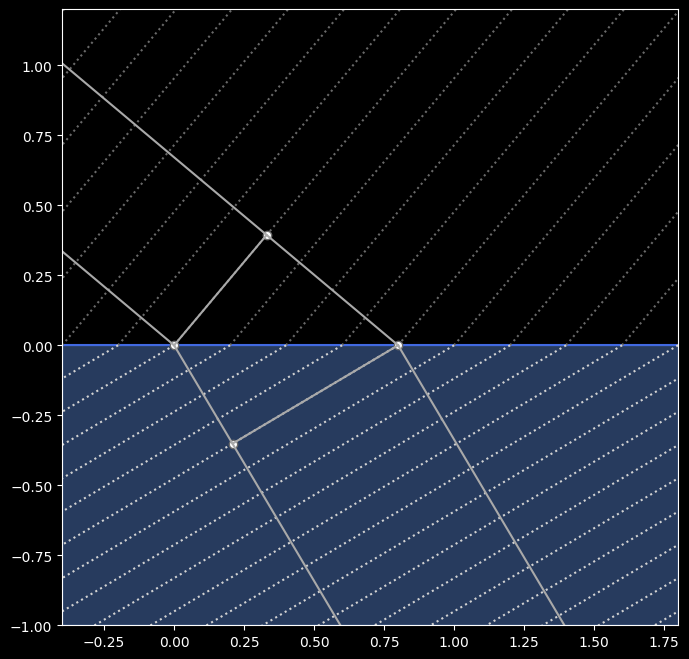

In [6]:
%matplotlib inline
PlotDiagramSnell()

#### ___Simulación___: La reflexión de la luz en una interfase

Con esta herramienta de simulación puedes estudiar el comportamiento de un rayo de luz al incidir en una interfase entre medios de distinto índice de refracción, $n_1$ y $n_2$.

Prueba a cambiar los valores del ángulo de incidencia y los índices de refracción de los medios.

In [8]:
widgets = [
ipywidgets.widgets.FloatSlider(description='$\\theta_i$', min=0, max=90, step=0.01, value=60),
ipywidgets.widgets.FloatSlider(description='$n_1$', min=1, max=3, step=0.01, value=1),
ipywidgets.widgets.FloatSlider(description='$n_2$', min=1, max=3, step=0.01, value=1.3),
]

for i in widgets:
    i.style.handle_color = 'forestgreen'

@interact( ti=widgets[0], n1=widgets[1], n2=widgets[2])
def InteractSnell( ti, n1, n2 ):
    PlotSnell( ti, n1, n2 )


interactive(children=(FloatSlider(value=60.0, description='$\\theta_i$', max=90.0, step=0.01, style=SliderStyl…

Estudiemos un poco como es el rayo refractado en función de los otros parámetros:

$$
\theta_2 = \mathrm{arcsen}\left(\frac{n_1}{n_2}\mathrm{sen}\theta_1\right)
$$

Para que $\theta_2$ exista, $\displaystyle\left|\frac{n_1}{n_2}\mathrm{sen}\theta_1\right|\geq1$. Puesto que $\theta_1\in[0,\pi/2]$, $\mathrm{sen}\theta_1\geq1$, y como $n>1$, el resultado dependerá de los valores de $n_1$ y $n_2$:

- Si $n_1= n_2$, estamos ante el caso trivial de que los medios son idénticos, luego $\theta_1=\theta_2$
- Si $n_1<n_2$, entonces $\displaystyle\frac{n_1}{n_2}<1$, por lo que $\theta_2$ está definido siempre.
- Si $n_2>n_1$, para que $\displaystyle\frac{n_1}{n_2}\mathrm{sen}\theta_1<1$ se tiene que cumplir que $\theta_1<\mathrm{arcsen}\left(\frac{n_2}{n_1}\right)$. 

El valor $\theta_c=\mathrm{arcsen}\left(\frac{n_2}{n_1}\right)$ se conoce como ángulo crítico, y marca el límite de la refracción: a ángulos $\theta>\theta_c$ la luz no atraviesa la interfase, sino que se refleja en la superficie.

En general, cuando la luz incide sobre una superficie, parte de la luz atraviesa la interfase refractándose, y parte se refleja en la superficie con el mismo ángulo de incidencia.

## ___Reflexiona___

Escribe debajo de cada una de las cuestiones tu respuesta. Usa las visualicaciones anteriores o prueba a hacer simulaciones para ayudarte.

__1)__ ¿Qué significa que la frecuencia de una onda no cambie, independientemente de la velocidad de propagación?

__2)__ ¿Cómo tiene que ser el índice de refracción de un medio, $n$, para que una onda que se mueve en un medio de índice $n_0$ aumente su longitud de onda? ¿Y para reducirla?

__3)__ ¿En qué casos es el ángulo de refracción $\theta_r$ menor que el de incidencia $\theta_i$? ¿Y cuándo mayor?

__4)__ ¿Se te ocurren ejemplos en tu entorno donde se manifieste la refracción de la luz?